In [1]:
from pylab import *
%matplotlib inline
import imageio
import numpy as np
import scipy
from scipy import ndimage
import skimage
from skimage import color, exposure, filters, img_as_float
import time

image_path = "../sekvence/"

## Zadatak 1

Dimenzije ulazne slike su:  (1200, 2480)


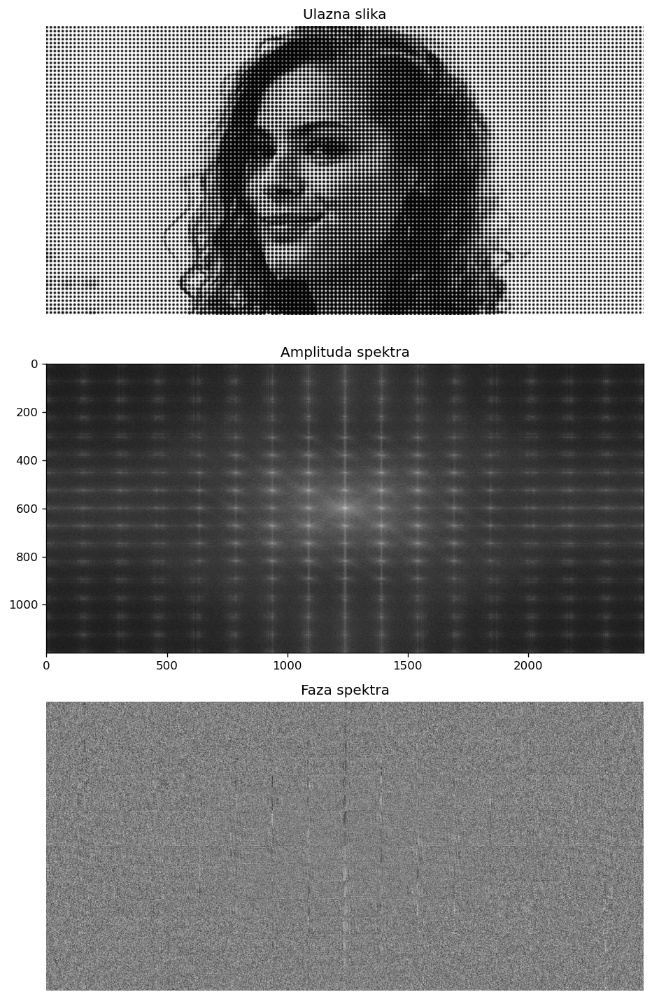

In [2]:
# Učitavanje ulazne slike
image = img_as_float(imread(image_path + "girl_ht.tif"))
print("Dimenzije ulazne slike su: ", image.shape)

# Furijeova transformacija ulazne slike
I = fftshift(fft2(image))
# Amplitudski spektar
Imag = np.log(1+abs(I))
# Fazni spektar
Iph = np.angle(I)

# Prikaz ulazne slike i njenih spektralnih komponenti
fig, axes = subplots(nrows=3, figsize=(18,12), dpi=120)
ax = axes.ravel()

ax[0].imshow(image, cmap='gray')
ax[0].set_title("Ulazna slika")
ax[0].set_axis_off()

ax[1].imshow(Imag, cmap='gray')
ax[1].set_title("Amplituda spektra")
#ax[1].set_axis_off()

ax[2].imshow(Iph, cmap='gray')
ax[2].set_title("Faza spektra")
ax[2].set_axis_off()

plt.tight_layout()
plt.show()

Na osnovu amplitudskog spektra ulazne slike mogu se uočiti smetnje u vidu ekvidistantnih peak-ova kojih po širini slike (2480) ima 17 i visini slike (1200) ima takođe 17. Ideja je potisnuti smetnje notch filtrom sa centrima tako da preklapaju peak-ove na spektru (osim DC komponente ulazne slike).

### Funkcija za filtriranje notch filtrom

In [3]:
def notch_reject(M, N, centers, sigma):
    """
    Opis funkcije:
        Funkcija kreira masku notch filtra (nepopusnika opsega)
        u frekvencijskom domenu
    Ulazni argumenti:
        M:
            Vertikalna dimenzija slike/filtra
        N:
            Horizontalna dimenzija slike/filtra
        centers:
            Lista parova koji predstavljaju kooridnate spektra
            smetnji koje treba potisnuti
        sigma:
            Standardna devijacija gaussovog filtra
    Izlazni argument:
            Maska filtra
    """
    
    # Formiranje maske filtra
    notch = np.zeros((M,N))
    
    # Formiranje vektora dužine M centriranog oko nule
    if (M%2 == 0):
        y = np.arange(0,M) - M/2 + 1
    else:
        y = np.arange(0,M) - (M-1)/2
        
    # Formiranje vektora duzine N centriranog oko nule
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 1
    else:
        x = np.arange(0,N) - (N-1)/2      
    
    # Izbegavanje ponavljanja operacije 2*sigma^2
    sigma = 2*(sigma**2)
    
    for center in centers:
        # Centriranje Gauss-ovog filtra oko smetnji
        if (M%2 == 0):
            yc = y - (center[1] - M/2 + 0.5)
        else:
            yc = y - (center[1] - (M-1)/2)
        
        if (N%2 == 0):
            xc = x - (center[0] - N/2 + 0.5)
        else:
            xc = x - (center[0] - (N-1)/2)
            
        Xc, Yc = meshgrid(xc, yc)
        
        notch += np.exp(-(np.square(Xc) + np.square(Yc))/sigma)
        
    return 1-notch

### Kreiranje notch filtra

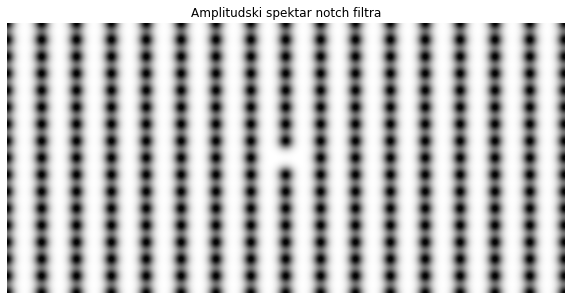

In [4]:
# Inicijalizacija liste parova koordinata koje notch filtar treba da potisne
C = []
# Uzimanje dimenzija ulazne slike
M, N = image.shape

# Pozicija centara smetnji koje treba otkloniti
y = linspace(0,M-1,17) # vertikalne koordinate
x = linspace(0,N-1,17) # horizontalne koordinate

# Formiranje liste parova koordinata koje notch filtar treba da potisne
for i in range(0,17):
    for j in range(0,17):
        # Izostavljanje centralne komponente
        if(i != 8 or j != 8):
            C.append([int(x[j]), int(y[i])])

# Formiranje notch filtra
H = notch_reject(M, N, C, 25)

# Prikaz aplitudske karakteristike notch filtra
plt.figure(figsize=(10,10))
imshow(np.log(1+abs(H)), cmap='gray')
plt.title("Amplitudski spektar notch filtra")
plt.axis("off")
plt.show()

### Potiskivanje tačkastih periodičnih smetnji

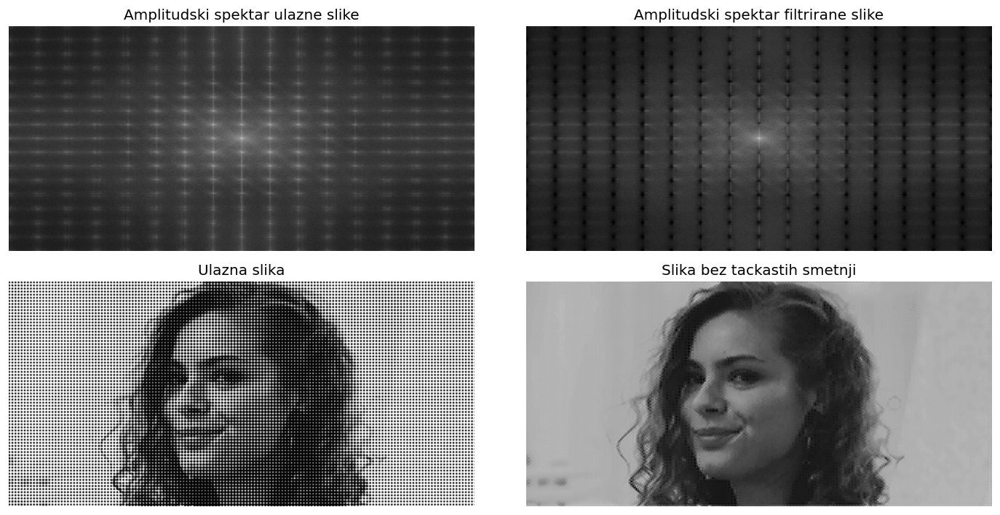

In [5]:
# Množenje u frekvencijskom domenu/Konvolucija u prostornom domenu (filtriranje)
G = I*H

# Inverzna furijeova transformacija
image_out = real(ifft2(ifftshift(G)))

# Ograničavanje opsega
image_out[image_out<0] = 0
image_out[image_out>1] = 1

# Prikaz dobijenih rezultata
fig, axes = subplots(nrows=2, ncols=2, figsize=(12,6), dpi=120)
ax = axes.ravel()

ax[0].imshow(np.log(1+abs(I)), cmap='gray')
ax[0].set_title("Amplitudski spektar ulazne slike")
ax[0].set_axis_off()

ax[1].imshow(np.log(1+abs(G)), cmap='gray')
ax[1].set_title("Amplitudski spektar filtrirane slike")
ax[1].set_axis_off()

ax[2].imshow(image, cmap='gray', vmin=0, vmax=1)
ax[2].set_title("Ulazna slika")
ax[2].set_axis_off()

ax[3].imshow(image_out, cmap='gray', vmin=0, vmax=1)
ax[3].set_title("Slika bez tackastih smetnji")
ax[3].set_axis_off()

plt.tight_layout()
plt.show()

### Dodatno poboljšanje kvaliteta slike

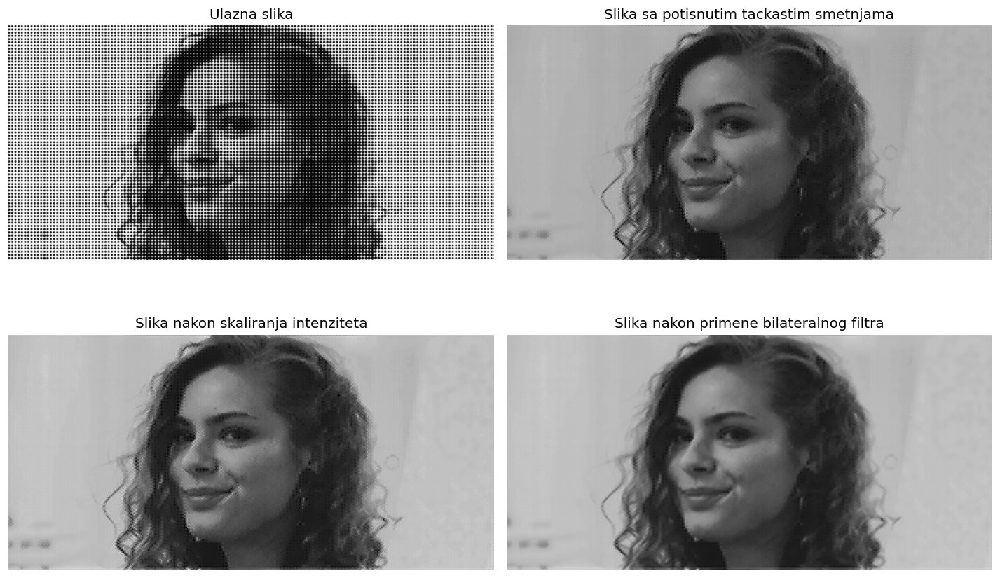

In [6]:
from skimage.restoration import denoise_bilateral

# Skaliranje intenziteta
image_rescaled = exposure.rescale_intensity(image_out)

# Bilateralni filtar
image_bilateral = denoise_bilateral(image_rescaled, 11, 0.2, 4)

# Prikaz međukoraka za dobijanje konačne slike
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8), dpi=120)
ax = axes.flatten()

ax[0].imshow(image, cmap='gray', vmin=0, vmax=1)
ax[0].set_title("Ulazna slika")
ax[0].set_axis_off()

ax[1].imshow(image_out, cmap='gray', vmin=0, vmax=1)
ax[1].set_title("Slika sa potisnutim tackastim smetnjama")
ax[1].set_axis_off()

ax[2].imshow(image_rescaled, cmap='gray', vmin=0, vmax=1)
ax[2].set_title("Slika nakon skaliranja intenziteta")
ax[2].set_axis_off()

ax[3].imshow(image_bilateral, cmap='gray', vmin=0, vmax=1)
ax[3].set_title("Slika nakon primene bilateralnog filtra")
ax[3].set_axis_off()

plt.tight_layout()
plt.show()

## Zadatak 2

### Analiza histograma lokalnih varijansi

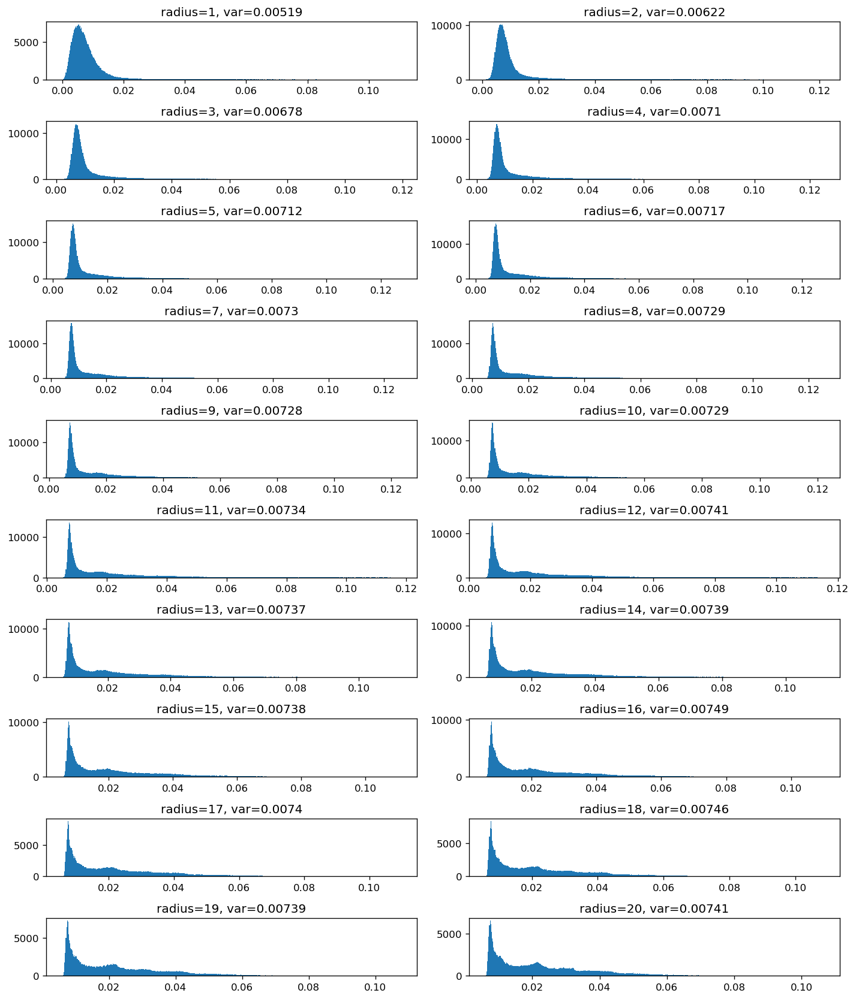

In [7]:
# Učitavanje slike
image = img_as_float(imread(image_path+"lena_noise.tif"))

# Vektor radijusa
radius = np.arange(1,21)
# Broj ćelija histograma
Nbins = 500
# Maksimalne vrednosti varijanse estimirane na lokalnim prozorima
var = []

# Prikaz histograma za svaki od radijusa
fig, axes = subplots(ncols=2, nrows=10, figsize=(12,14), dpi=120)
ax = axes.ravel()

for i in range(20):
    
    # Prozor za usrednjavanje
    kernel =  np.ones((2*radius[i]+1, 2*radius[i]+1))/((2*radius[i]+1)*(2*radius[i]+1))
    
    # Usrednjavanje originalne slike
    image_avg = ndimage.correlate(image,kernel)

    # Usrednjavanje kvadrata originalne slike
    image_avg_square = ndimage.correlate(np.square(image),kernel)
    
    # Estimacija lokalne varijanse
    image_var = image_avg_square - np.square(image_avg)
    
    # Računanje histograma
    hist, bin_edges = np.histogram(image_var.flatten(), Nbins);
    
    # Traženje najučestalije vrednosti varijanse
    val_max = 0
    ind_max = 0
    for ind in range(0,Nbins):
        if hist[ind] > val_max:
            val_max = hist[ind]
            ind_max = ind
            
    # Uzimanje najučestanijih dobijenih varijansi
    var.append(bin_edges[ind_max])
    
    # Iscrtavanje histograma
    ax[i].hist(image_var.flatten(), Nbins)
    ax[i].set_title("radius=" + str(radius[i]) + ", var=" + str(round(var[i],5)))

    
plt.tight_layout()
plt.show()

### Primena adaptivnog lokalnog filtriranja

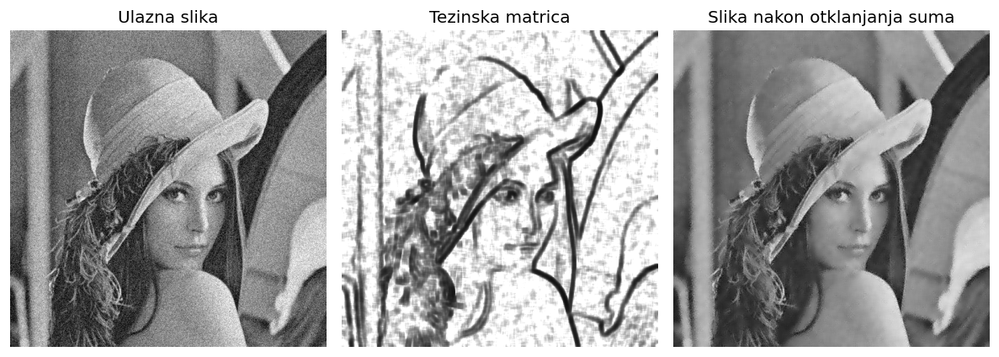

In [8]:
# Estimirana varijansa
var_est = 0.0071

# Radius lokalnog susedstva
radius = 4

# Prozor za usrednjavanje
kernel =  np.ones((2*radius+1, 2*radius+1))/((2*radius+1)*(2*radius+1))

# Usrednjavanje originalne slike
image_avg = ndimage.correlate(image,kernel)

# Usrednjavanje kvadrata originalne slike
image_avg_square = ndimage.correlate(np.square(image),kernel)

# Estimacija lokalne varijanse
image_var = image_avg_square - np.square(image_avg)

# Dobijanje matrice težina
w = var_est/image_var
w[w>1] = 1

# Adaptivno lokalno usrednjavanje
image_out = image + w*(image_avg-image)

fig, axes = subplots(ncols=3, figsize=(10,30), dpi=120)
ax = axes.ravel()

ax[0].imshow(image, cmap='gray', vmin=0, vmax=1)
ax[0].set_title("Ulazna slika")
ax[0].set_axis_off()

ax[1].imshow(w, cmap='gray', vmin=0, vmax=1)
ax[1].set_title("Tezinska matrica")
ax[1].set_axis_off()

ax[2].imshow(image_out, cmap='gray', vmin=0, vmax=1)
ax[2].set_title("Slika nakon otklanjanja suma")
ax[2].set_axis_off()

plt.tight_layout()
plt.show()

## Zadatak 3

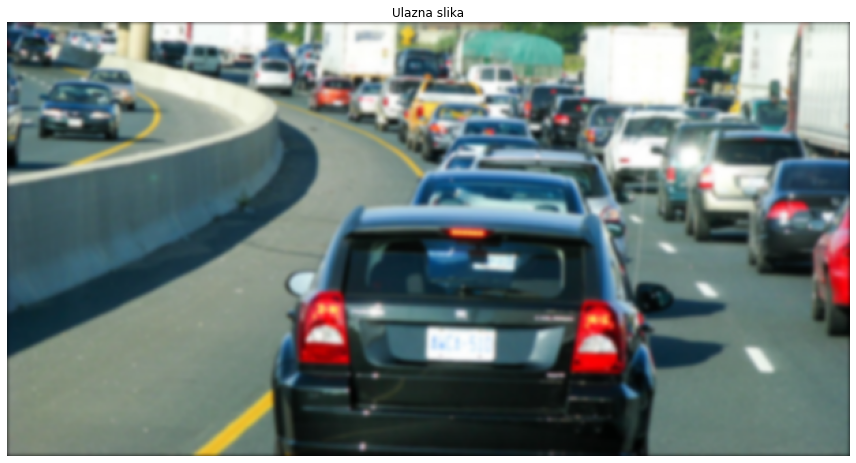

In [9]:
# Učitavanje slike
image = img_as_float(imread(image_path + "road_blur.png"))

# Uzimanje dimenzija
[M, N, C] = image.shape

# Prikaz ulazne slike
plt.figure(figsize=(12,12))
imshow(image, vmin=0, vmax=1)
plt.title("Ulazna slika")
plt.axis("off")
plt.tight_layout()
plt.show()

### Definisanje funkcije za kreiranje Gauss-ovog filtra u frekvencijskom domenu

In [10]:
def gaussian(sigma, M, N):
    """
    Opis funkcije:
        Funkcija za kreiranje maske Gaussovog filtra
        u frekvencijskom domenu
    Ulazni argumenti:
        sigma:
            Standardna devijacija
        M:
            Vertikalna dimenzija filtra
        N:
            Horizontalna dimenzija filtra
    Izlazni argumenti:
        filter_mask:
            Gaussov filtar u frekvencijskom domenu
    """

    # Centriranje koordinata oko 0
    if (M%2 == 0):
        y = np.arange(0,M) - M/2 + 0.5
    else:
        y = np.arange(0,M) - (M-1)/2
    if (N%2 == 0):
        x = np.arange(0,N) - N/2 + 0.5
    else:
        x = np.arange(0,N) - (N-1)/2
    
    X, Y = meshgrid(x,y)
    
    # Računanje distance od centralne vrednosti
    D = np.sqrt(np.square(X) + np.square(Y)) 
    
    # Kreiranje maske
    filter_mask = exp(-np.square(D)/(2*np.square(sigma)))
    
    return filter_mask

### Definicija funkcije inverznog filtriranja

In [11]:
def inverse_filt(image, sigma, k, plot='false'):
    """
    Opis funkcije:
        Unutar funkcije se slika proširuje sa desne i donje strane
        svojim likom u vertikalnom i horizontalnom ogledalu, respektivno.
        Formiraju se Gaussov filtar u frekvencijskom domenu, na osnovu 
        njega Wiener-ov filtar i svaka od RGB komponenti ulazne slike
        se zasebno filtrira i smešta u matricu u izlazne slike.
    Ulazni argumenti:
        image:
            Slika nad kojom treba izvršiti inverzno filtriranje
        sigma:
            Standardna devijacija Gaussovog filtra
        k:
            Koeficijent Wiener-ovog filtra
        plot:
            Opciono, za iscrtavanje međurezultata
    Izlazni argumenti:
        image_out:
            Filtrirana slika
    """
    # Dimenzije ulazne slike
    M, N = image[:,:,0].shape
    
    # Dimenzije proširene slike
    Mp = 2*M
    Np = 2*N

    # Proširivanje slike refleksijom slike oko desne i donje ivice
    imagepad = np.zeros((Mp, Np, 3))
    for i in range(3):
        imagepad[0:M, 0:N,i] = image[:,:,i]
        # Donji desni ugao
        imagepad[M:Mp,N:Np,i] = np.flip(image[:,:,i], [0, 1])
        # Prostor ispod slike
        imagepad[M:Mp,0:N,i] = np.flip(image[:,:,i], 0)
        # Prostor desno od slike
        imagepad[0:M,N:Np,i] = np.flip(image[:,:,i], 1)

    
    # Formiranje matrica za smeštanje rezultata
    Irgb = np.zeros((Mp, Np, 3))
    Gest = np.zeros((Mp, Np, 3))
    Fest = np.zeros((Mp, Np, 3))
    image_out = np.zeros((M, N, 3))
    
    # Model degradacije u frekvencijskom domenu
    H_blur = gaussian(sigma, Mp, Np)

    # Wienerov filtar
    W = np.square(H_blur)/(np.square(H_blur) + k)
    
    # Inverzno filtriranje za svaku od RGB komponenti
    for i in range(3):
        
        # Furijeova transformacija jedne komponente ulazne slike
        Irgb[:,:,i] = fftshift(fft2(imagepad[:,:,i]))

        # Inverzno filtriranje
        Gest[:,:,i] = Irgb[:,:,i]/H_blur
        
        # Primena Wiener-ovog filtra
        Fest[:,:,i] = Gest[:,:,i]*W

        # Inverzna Furijeova transformacija
        fest = real(ifft2(ifftshift(Fest[:,:,i])))

        # Ogranicavanje vrednosti piksela
        fest[fest>1] = 1
        fest[fest<0] = 0

        # Smestanje filtrirane komponente u izlaznu sliku
        image_out[:,:,i] = fest[0:M,0:N]
        
    
    # Opcioni prikaz međurezultata
    if (plot == 'true'):
        
        # Prikaz modela degradacije i Wiener-ovog filtra u spektru
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,12), dpi=120)
        ax = axes.ravel()
        
        ax[0].imshow(np.log(1+abs(H_blur)), cmap='gray')
        ax[0].set_title("Amplitudski spektar modela degradacije")
        ax[0].set_axis_off()
        
        ax[1].imshow(np.log(1+abs(W)), cmap='gray')
        ax[1].set_title("Wiener-ov filtar")
        ax[1].set_axis_off()
        
        plt.tight_layout()
        plt.show()
        
        # Prikaz međurezultata u vidu amplitudskih spektara
        fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,8), dpi=120)
        ax = axes.ravel()
        fig.suptitle("Prikaz medjurezultata po komponentama")
        
        for i in range(3):
            ax[i*3].imshow(np.log(1+abs(Irgb[:,:,i%3])), cmap='gray')
            ax[i*3].set_title("Amplitudski spektar ulazne slike")
            ax[i*3].set_axis_off()
            
            ax[i*3 + 1].imshow(np.log(1+abs(Gest[:,:,i%3])), cmap='gray')
            ax[i*3 + 1].set_title("Nakon inverznog filtriranja")
            ax[i*3 + 1].set_axis_off()
            
            ax[i*3 + 2].imshow(np.log(1+abs(Fest[:,:,i%3])), cmap='gray')
            ax[i*3 + 2].set_title("Nakon Wiener-ovog filtra")
            ax[i*3 + 2].set_axis_off()
        
        plt.tight_layout()
        plt.show()
        
    return image_out


### Primena inverznog filtriranja

C:\Users\Grbic\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:57: ComplexWarning: Casting complex values to real discards the imaginary part


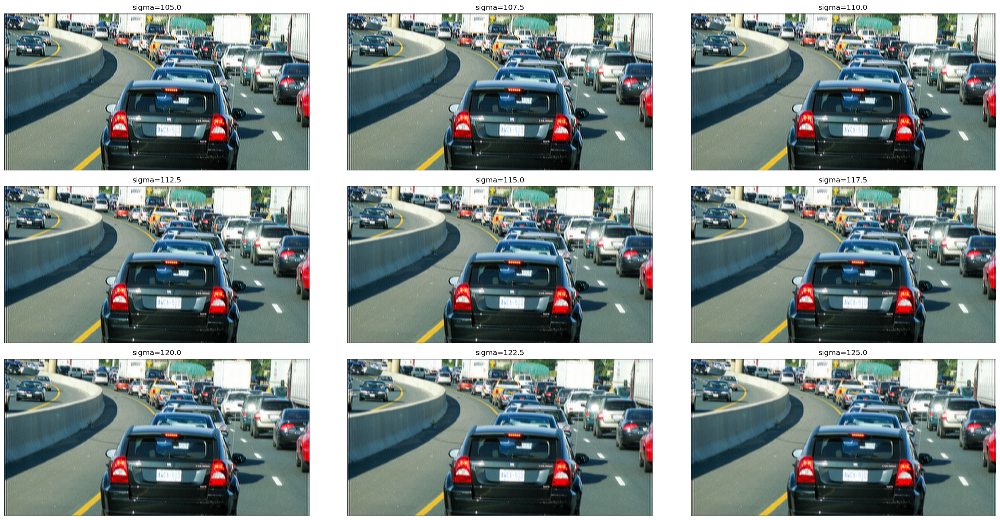

In [12]:
# Vektor mogućih vrednosti standardne devijacije
sigma = np.linspace(105, 125, 9)

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24,12), dpi=120)
ax = axes.ravel()

for i in range(9):
    # Inverzno filtriranje
    image_out = inverse_filt(image, sigma[i], 1e-4)
    
    # Prikaz dobijenih rezultata za trenutno sigma
    ax[i].imshow(image_out, cmap='gray', vmin=0, vmax=1)
    ax[i].set_title("sigma="+str(sigma[i]))
    ax[i].set_axis_off()
    
plt.tight_layout()
plt.show()

C:\Users\Grbic\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:57: ComplexWarning: Casting complex values to real discards the imaginary part


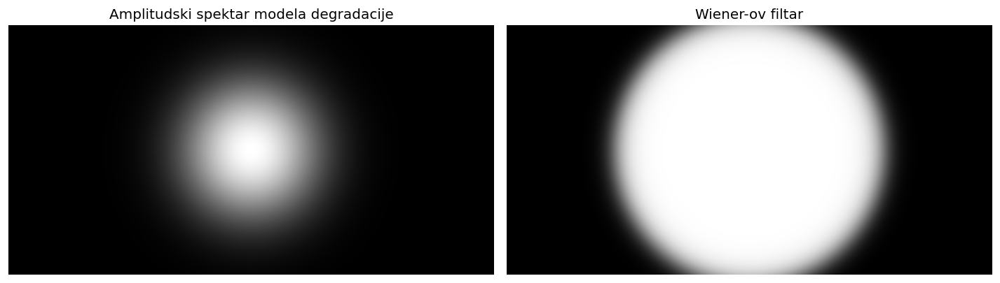

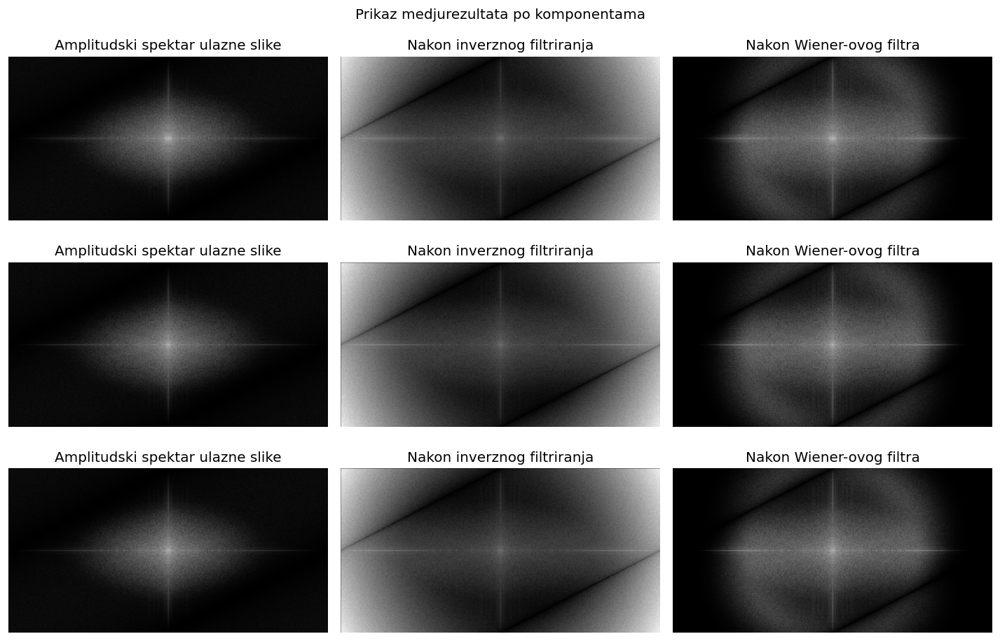

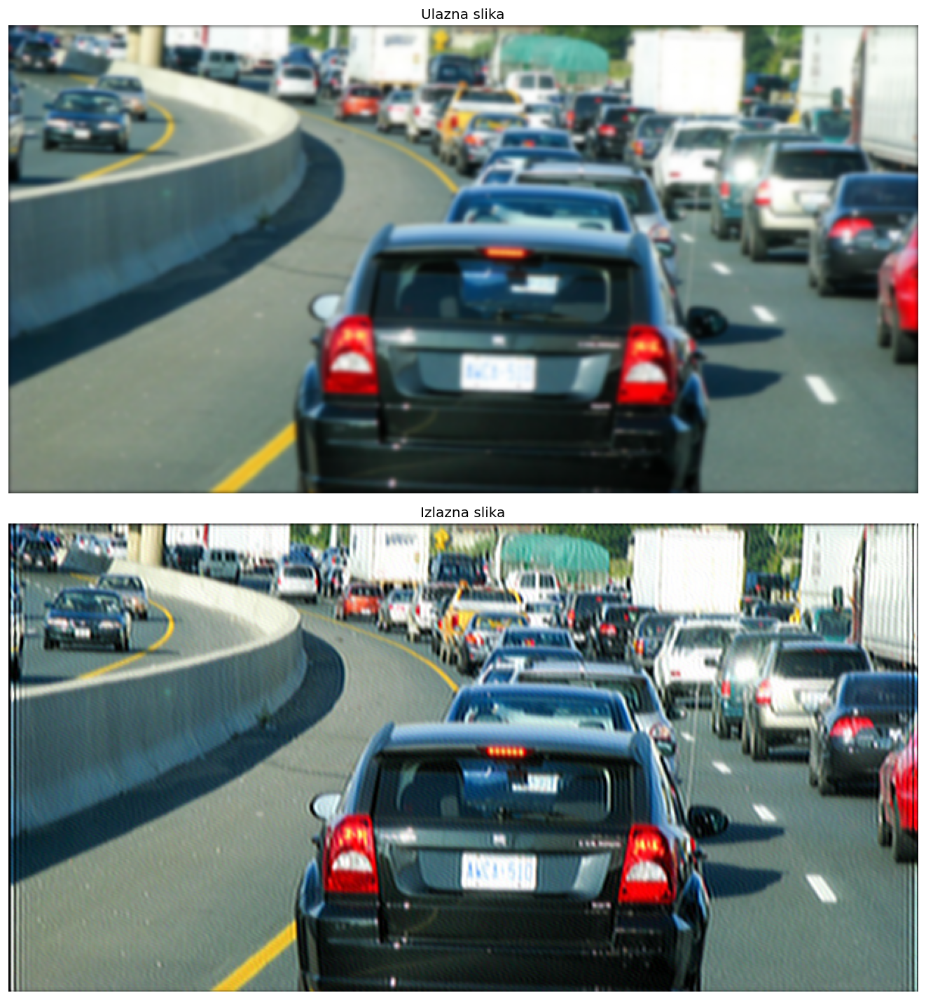

In [13]:
# Primena optimalnih parametara za inverzno filtriranje
image_out = inverse_filt(image, 110, 1e-4, 'true')

# Prikaz dobijenih rezultata za izabrano sigma
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12,12), dpi=120)

ax[0].imshow(image, cmap='gray', vmin=0, vmax=1)
ax[0].set_title("Ulazna slika")
ax[0].set_axis_off()

ax[1].imshow(image_out, cmap='gray', vmin=0, vmax=1)
ax[1].set_title("Izlazna slika")
ax[1].set_axis_off()
    
plt.tight_layout()
plt.show()

### Izdvajanje tablica

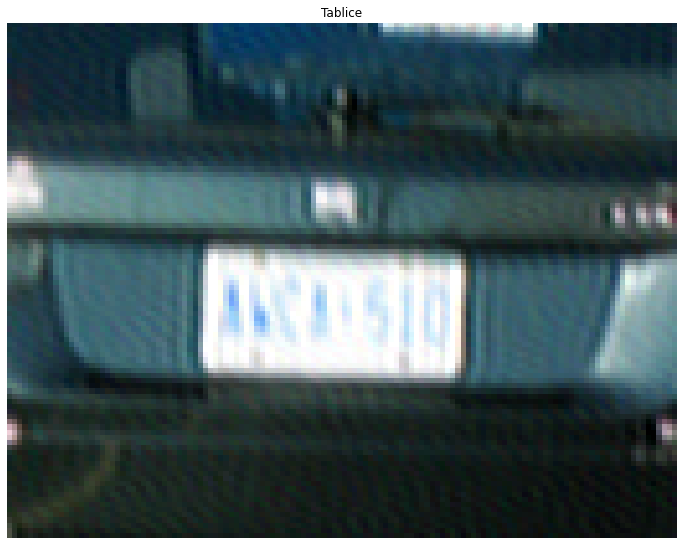

In [14]:
plt.figure(figsize=(12,12))
plt.imshow(image_out[180:280,270:400,:], interpolation='none') # [227:247,308:358]
plt.title("Tablice")
plt.axis("off")
plt.show()

## Zadatak 4

### Funkcija filter_gauss

In [15]:
def filter_gauss(image, radius, sigma):
    """
    Opis funkcije:
        Ulazna slika se proširuje za veličinu radiusa
        oko svake ivice i popunjava ivičnim vrednostima
        piksela. Jednodimenzioni kernel Gauss-ovog filtra
        se primenjuje na sliku horizontalno i na dobijenu
        filtriranu sliku se primenjuje vertikalno filtriranje
        istim kernelom.
    Ulazni argumenti:
        radius:
            Radijus filtra
        sigma:
            Standardna devijacija Gauss-ovog filtra
    Izlazni argumenti:
        image_out:
            Filtrirana slika
    """
    
    # Očitavanje dimenzija slike
    [M, N] = image.shape
    
    # Proširivanje slike (inicijalizacija)
    imagep = np.zeros((M+2*radius, N+2*radius))
    
    # Popunjavanje centralnog dela proširene slike
    imagep[radius:(M+radius), radius:(N+radius)] = image;
    
    # Ponavljanje elemenata sa ivica slike
    for i in range(radius):
        imagep[radius:(M+radius),i] = image[:,0] # Leva strana
        imagep[radius:(M+radius),N+radius+i] = image[:,N-1] # Desna strana
        imagep[i, radius:(N+radius)] = image[0,:] # Gornja strana
        imagep[M+radius+i, radius:(N+radius)] = image[M-1,:] # Donja strana
        
    imagep[0:radius,0:radius] = image[0,0] # Gornji levi ugao
    imagep[0:radius, (M+radius):(M+2*radius)] = image[0,N-1] # Gornji desni ugao
    imagep[(M+radius):(M+2*radius), 0:radius] = image[M-1,0] # Donji levi ugao
    imagep[(M+radius):(M+2*radius), (N+radius):(N+2*radius)] = image[M-1,N-1] # Donji desni ugao
    
    
    # Formiranje 1D kernela za filtriranje u prostornom domenu
    gauss = np.ones((2*radius+1))
    
    # Vektor rastojanja
    dist = np.arange(-radius,0)
    
    # Koeficijenti jedne strane strane 1D Gaussovog filtra
    gauss[0:radius] = np.exp(-(np.square(dist))/(2*sigma*sigma))
    
    # Kopiranje koeficijenata na simetricnu stranu Gaussovog filtra
    gauss[(radius+1):(2*radius+1)] = np.flip(gauss[0:radius])
    
    # Normalizacija koeficijenata
    gauss /= sum(gauss)


    # Inicijalizacija izlazne slike
    image_out = np.zeros_like(imagep)
    
    # Mnozenje centralnim elementom
    image_out = imagep*gauss[radius]
    
    # Horizontalno filtriranje
    
    """
    Ovo filtriranje se primenjuje na sve kolone proširene slike
    koje pripadaju originalnoj slici i na sve vrste proširene slike.
    Moraju se uzeti u obzir sve vrste jer će vertikalnim filtriranjem 
    i one biti obuhvaćene.
    """
    for k in range(radius):
        image_out[:,radius:(N+radius)] += imagep[:, k:(N+k)]*gauss[k]
        image_out[:,radius:(N+radius)] += imagep[:, (radius+1+k):(N+radius+1+k)]*gauss[radius+1+k]
        
    # Smeštanje filtriranih vrednosti u proširenu sliku
    imagep = image_out.copy()
    
    # Množenje filtrirane slike centralnim elementom Gauss-ovog kernela
    image_out *= gauss[radius]
    
    # Vertikalno filtriranje
    for k in range(radius):
        image_out[radius:(M+radius), radius:(N+radius)] += imagep[k:(M+k), radius:(N+radius)]*gauss[k]
        image_out[radius:(M+radius), radius:(N+radius)] += imagep[(radius+1+k):(M+radius+1+k), radius:(N+radius)]*gauss[radius+1+k]
    
    """
    Objašnjenje implementacije:
    Ideja je da se svi pikseli koji ulaze u zbir (kod korelacije) množe težinskim koeficijentom
    Gaussovog filtra i sabiraju sa pikselom pomerenim u desno/levo u zavisnosti od koeficijenta.
    
    Ovakva implementacija je dosta brža od klasične (for petlja po M, N i k) jer izbegava spore
    for petlje u pythonu i koristi C-ovsi operartor ":", dok se for petlja vrši samo po radijusu.
    """
    
    return image_out[radius:(M+radius), radius:(N+radius)]

### Funkcija filter_gauss_freq

In [16]:
def filter_gauss_freq(image, radius, sigma):
    """
    Opis funkcije:
        Ulazna slika se proširuje za veličinu 2*radiusa
        i popunjava ponavljanjem ivičnih vrednosti i formirani 
        Gauss-ov filtar se proširuje do dimenzija koje
        odgovaraju proširenoj slici. Množenjem furijeovih
        transformacija proširene slike i proširenog filtra
        i inverznom furijeovom transformacijom dobija se
        filtrirana slika.
    Ulazni argumenti:
        image:
            Slika nad kojom treba vršiti filtriranje
        radius:
            Radijus filtra
        sigma:
            Standardna devijacija Gauss-ovog filtra
    Izlazni argumenti:
        image_out:
            Filtrirana slika
    """
    
    # Ocitavanje dimenzija slike
    [M, N] = image.shape

    # Proširivanje slike (inicijalizacija)
    imagep = np.zeros((M+2*radius, N+2*radius))
    
    # Popunjavanje centralnog dela proširene slike
    imagep[radius:(M+radius), radius:(N+radius)] = image;
    
    # Ponavljanje elemenata sa ivica slike
    for i in range(radius):
        imagep[radius:(M+radius),i] = image[:,0] # Leva strana
        imagep[radius:(M+radius),N+radius+i] = image[:,N-1] # Desna strana
        imagep[i, radius:(N+radius)] = image[0,:] # Gornja strana
        imagep[M+radius+i, radius:(N+radius)] = image[M-1,:] # Donja strana
        
    imagep[0:radius,0:radius] = image[0,0] # Gornji levi ugao
    imagep[0:radius, (M+radius):(M+2*radius)] = image[0,N-1] # Gornji desni ugao
    imagep[(M+radius):(M+2*radius), 0:radius] = image[M-1,0] # Donji levi ugao
    imagep[(M+radius):(M+2*radius), (N+radius):(N+2*radius)] = image[M-1,N-1] # Donji desni ugao
    
    # Furijeova transformacija ulazne slike
    I = fftshift(fft2(imagep))
    
    # Formiranje Gaussovog filtra
    gauss = np.ones((2*radius+1,2*radius+1))
    
    # Racunanje simetricnog dela kernela
    sym = [[np.exp(-(i*i + j*j)/(2*sigma*sigma)) for i in range(radius+1)] for j in range(radius+1)]
    sym = np.array(sym)

    
    # Gornji desni kvadrat 2D kernela
    gauss[radius:(2*radius+1),radius:(2*radius+1)] = sym
    # Donji desni kvadrat 2D kernela
    gauss[0:(radius+1),radius:(2*radius+1)] = np.flip(sym, 0)
    # Donji levi kvadrat 2D kernela
    gauss[radius:(2*radius+1),0:(radius+1)] = np.flip(sym, 1)
    # Gornji levi kvadrat 2D kernela
    gauss[0:(radius+1),0:(radius+1)] = np.flip(sym, (0, 1))
    
    # Normalizacija koeficijenata Gaussovog filtra
    gauss /= sum(gauss)
    
    # Prosirivanje Gaussovog filtra nulama do dimenzija prosirene slike
    gaussp = np.zeros_like(imagep)
    gaussp[0:(2*radius+1),0:(2*radius+1)] = gauss
    
    # Furijeova transformacija Gaussovog filtra
    G = fftshift(fft2(gaussp))
    
    # Konvolucija u prostornom domenu / Mnozenje u spektralnom domenu
    R = I*G
    
    # Vracanje dobijene slike u prostorni domen
    image_out = real(ifft2(ifftshift(R)))

    return image_out[2*radius::, 2*radius::]

### Poređenje izlaznih slika primenom filtara

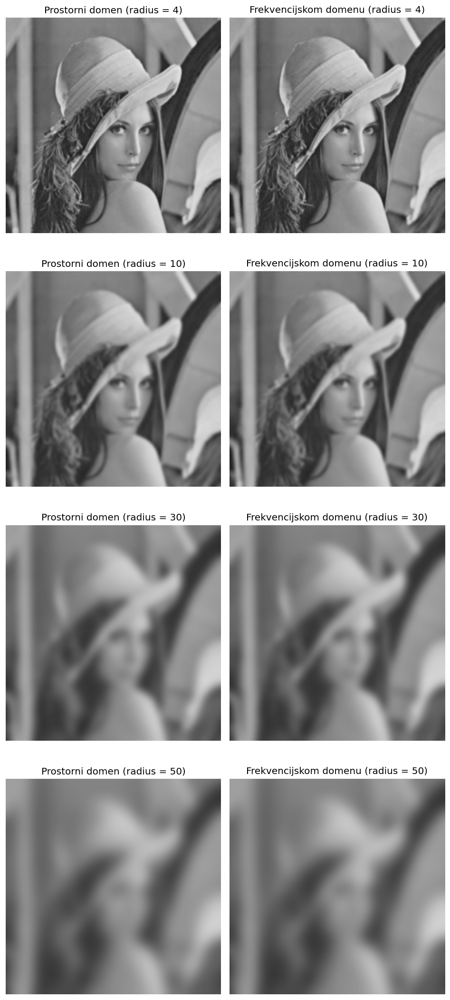

In [17]:
# Učitavanje slike
image = img_as_float(imread('lena.tif'))

# Vektor radijusa i standardnih devijacija
radius = np.array((4, 10, 30, 50))
sigma = radius/3

# Prikaz poređenja izlaznih slika filtara
fig, axes = plt.subplots(nrows=len(radius), ncols=2, figsize=(8,18), dpi=120)
ax = axes.ravel()

for i in range(len(radius)):
    image_s = filter_gauss(image, radius[i], sigma[i])
    ax[2*i].imshow(image_s, cmap='gray', vmin=0, vmax=1)
    ax[2*i].set_title("Prostorni domen (radius = " + str(int(radius[i])) + ")")
    ax[2*i].set_axis_off()

    image_f = filter_gauss_freq(image, radius[i], sigma[i])
    ax[2*i+1].imshow(image_f, cmap='gray', vmin=0, vmax=1)
    ax[2*i+1].set_title("Frekvencijskom domenu (radius = " + str(int(radius[i])) + ")")
    ax[2*i+1].set_axis_off()

plt.tight_layout()
plt.show()

### Poređenje vremena izvršavanja

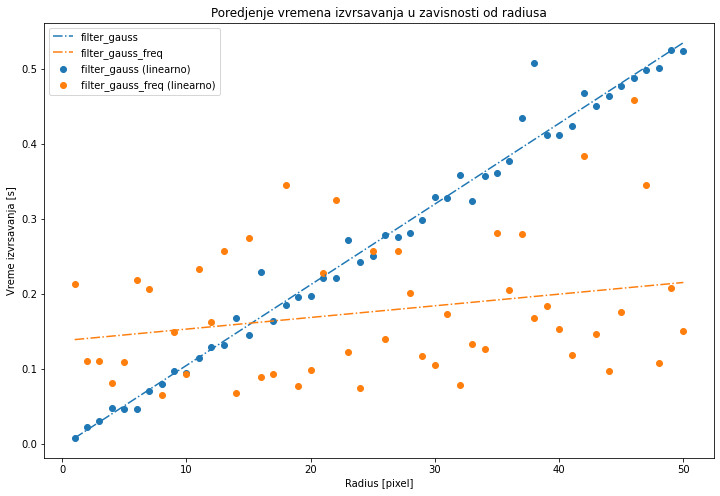

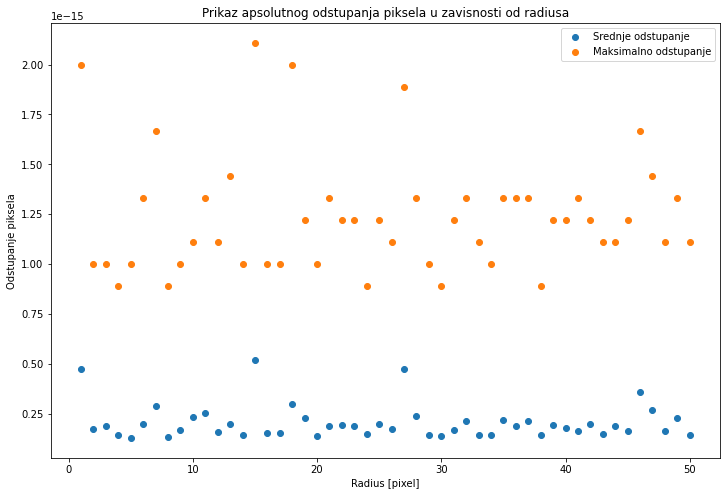

Granicni radius do kojeg je optimalno koristiti Gaussov filtar u prostornom domenu u ovom slucaju iznosi: 15
Ocekivano srednje odstupanje je:  1.87150844434874e-16
Ocekivano maksimalno odstupanje je:  1.2212453270876722e-15


In [18]:
def linear_regression(x, y):
    """
    Opis funkcije:
        Funkcija ima za cilj da estimira parametre linearne regresije
        i na taj način "ispegla" oscilacije nastale pri merenju vremena
        u formi linearne regresije:
            y = k*x + n
        
    Ulazni argumenti:
        x : nezavisna promenljiva (radius)
        y : zavisna promenljiva (vreme izvršavanja)
        
    Izlazni argumenti:
        k : nagib fitovane prave
        n : pomeraj (bias) fitovane prave
            
    """
    x_mean = np.mean(x)
    y_mean = np.mean(y)
    x_square = np.square(x)
    
    # Računanje imenioca
    den = sum(x_square) - x_mean*sum(x)
    
    # Računanje nagiba
    k = (sum(x*y) - y_mean*sum(x))/den
    
    # Računanje pomerenosti prave
    n = (y_mean*sum(x_square) - x_mean*sum(x*y))/den
    
    return k, n

# Liste za čuvanje vremena i radijusa
spatial = []
freq = []
radius_vect = []

# Vektor grešaka
error_mean = []
error_max = []

for radius in range(1,51):
    # Merenje brzine prostornog filtra
    start = time.time()
    image_s = filter_gauss(image, radius, radius/3)
    end = time.time()
    spatial.append(end-start)
    
    # Merenje brzine filtra u frekvencijskom domenu
    start = time.time()
    image_f = filter_gauss_freq(image, radius, radius/3)
    end = time.time()
    freq.append(end-start)
    
    # Generisanje vektora korišćenih radiusa
    radius_vect.append(radius)
    
    # Formiranje vektora srednje apsolutne greške
    error_mean.append(sum(abs(image_s-image_f))/np.size(image_s))
    # Formiranje vektora maksimalne apsolutne greške
    error_max.append(np.amax(abs(image_s-image_f)))
    
# Konverzija u numpy array
radius_vect = np.array(radius_vect)
spatial = np.array(spatial)
freq = np.array(freq)
error_mean = np.array(error_mean)
error_max = np.array(error_max)
    
# Estimacija parametara linearne regresije
k1, n1 = linear_regression(radius_vect, spatial)
k2, n2 = linear_regression(radius_vect, freq)

# Prikaz rezultata
plt.figure(figsize=(12, 8))

plt.scatter(radius_vect, spatial)
plt.scatter(radius_vect, freq)
plt.plot(radius_vect, radius_vect*k1+n1, '-.')
plt.plot(radius_vect, radius_vect*k2+n2, '-.')

plt.legend(["filter_gauss", "filter_gauss_freq","filter_gauss (linearno)", "filter_gauss_freq (linearno)"])
plt.xlabel("Radius [pixel]")
plt.ylabel("Vreme izvrsavanja [s]")
plt.title("Poredjenje vremena izvrsavanja u zavisnosti od radiusa")
plt.show()

# Prikaz rezultata
plt.figure(figsize=(12, 8))
plt.scatter(radius_vect, error_mean)
plt.scatter(radius_vect, error_max)
plt.legend(["Srednje odstupanje", "Maksimalno odstupanje"])
plt.xlabel("Radius [pixel]")
plt.ylabel("Odstupanje piksela")
plt.title("Prikaz apsolutnog odstupanja piksela u zavisnosti od radiusa")
plt.show()

print("Granicni radius do kojeg je optimalno koristiti Gaussov filtar u prostornom domenu u ovom slucaju iznosi: " + str(int(round((n2-n1)/(k1-k2)))))
print("Ocekivano srednje odstupanje je: ", np.median(error_mean))
print("Ocekivano maksimalno odstupanje je: ", np.median(error_max))

Kako je složenost filtriranja u prostornom domenu O(r * Np), gde je Np broj piksela ulazne slike, dobijeni rezultat opravdava očekivanje da vreme izvršavanja prostornog filtriranja linearno raste sa povećanjem radiusa. Filtriranje u frekvencijskom domenu ima blagi porast zbog proširenja slike za radijus filtra, ali kako je složenost u opštem slučaju O(Np * log(Np)), ovakav porast je beznačajan u odnosu na prostorni domen.